In [1]:
import numpy as np
import cv2  # импортирую ИСКЛЮЧИТЕЛЬНО для проверки правильно написанных мною функций

from time import time

import matplotlib.pyplot as plt

from tqdm.notebook import tqdm

### Всякие функции для фильтра Байера

In [2]:
def get_bayer_masks(n_rows, n_cols):
    result = np.zeros((n_rows, n_cols, 3))

    cols, rows = np.meshgrid(np.arange(n_cols), np.arange(n_rows))

    result[:, :, 0] = np.where((cols % 2 == 0) & (rows % 2 == 0), 1, 0)  # Red
    result[:, :, 1] = np.where((cols + rows + 1) % 2 == 0, 1, 0)         # Green
    result[:, :, 2] = np.where((cols % 2 == 1) & (rows % 2 == 1), 1, 0)  # Blue
    return result.astype(bool)


def get_colored_img(raw_img):
    return np.where(get_bayer_masks(*raw_img.shape), raw_img[..., np.newaxis], 0)

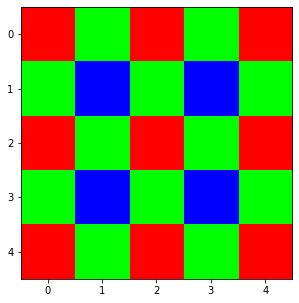

In [3]:
plt.figure(figsize=(5, 5))
plt.imshow(get_bayer_masks(5, 5) * 255)
plt.show()

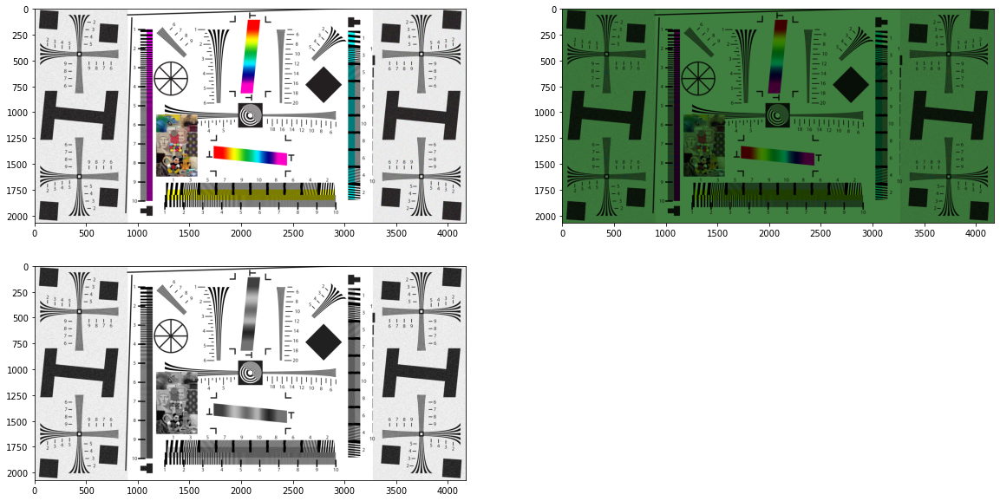

In [18]:
img = plt.imread("CFA.bmp")[..., 0]
colored_img = plt.imread("RGB_CFA.bmp")
original_img = plt.imread("Original.bmp")

plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.imshow(original_img)
plt.subplot(2, 2, 2)
plt.imshow(colored_img)
plt.subplot(2, 2, 3)
plt.imshow(img, cmap='gray')
plt.show()

(проверим, с какого цвета начинается фильтр здесь, чтобы настроить функцию получения матрицы Байера)

In [9]:
print(colored_img[0, 0])

[255   0   0]


### Метрика

In [10]:
def compute_psnr(img_pred, img_gt, eps=1e-18):
    mse = ((img_pred.astype(np.float64) - img_gt.astype(np.float64)) ** 2).mean()
    if mse < eps:
        raise ValueError
    return 10 * np.log10((img_gt.astype(np.float64) ** 2).max() / mse)

### Полезные функции для вычисления интерполяций

In [11]:
def get_shift(img, shift_x, shift_y):
    result = np.zeros(img.shape, dtype=np.float32)
    from_x1, from_x2 = max(0, shift_x), img.shape[0] + min(0, shift_x)
    from_y1, from_y2 = max(0, shift_y), img.shape[1] + min(0, shift_y)

    to_x1, to_x2 = max(0, -shift_x), img.shape[0] + min(0, -shift_x)
    to_y1, to_y2 = max(0, -shift_y), img.shape[1] + min(0, -shift_y)
    result[to_x1:to_x2, to_y1:to_y2] += img[from_x1:from_x2, from_y1:from_y2]
    return result


def shift_conv(img, shifts_x=None, shifts_y=None, weights=None, normed=True):
    result = np.zeros(img.shape, dtype=np.float32)
    if shifts_x is None or shifts_y is None:
        shifts_x = np.array([ 1, 1, 1, 0, 0,  0, -1, -1, -1])
        shifts_y = np.array([-1, 0, 1, 1, 0, -1, -1,  0,  1])
    else:
        shifts_x = np.array(shifts_x)
        shifts_y = np.array(shifts_y)
    weights = np.ones_like(shifts_x) if weights is None else np.array(weights)

    for shift_x, shift_y, weight in zip(shifts_x, shifts_y, weights):
        result += get_shift(img, shift_x, shift_y) * weight

    if normed:
        result /= weights.sum()
    return result

## Реализация нескольких методов интеполяции

### Билинейная интерполяция

In [12]:
def bilinear_interpolation(colored_img):
    bayer_mask = get_bayer_masks(*colored_img.shape[:-1])
    img_conv = shift_conv(colored_img)
    mask_conv = shift_conv(bayer_mask)
    inter = (img_conv / mask_conv).astype(dtype=np.uint8)

    # для известных значений ничего не интерполируем
    return colored_img + inter * (1 - bayer_mask)

### Улучшенная интерполяция

Взял из своей же домашки на курсе CV в ШАД

[Оригинальная статья](https://home.cis.rit.edu/~cnspci/references/dip/demosaicking/malvar2004.pdf)

In [13]:
def improved_interpolation(raw_img):
    common_shifts_x = np.array([0,  1,  1,  1,  0,  0, -1, -1, -1, -2,  0,  2,  0])
    common_shifts_y = np.array([0, -1,  0,  1,  1, -1, -1,  0,  1,  0,  2,  0, -2])

    g = np.clip(
        shift_conv(
            raw_img, shifts_x=common_shifts_x, shifts_y=common_shifts_y,
            weights=[4, 0, 2, 0, 2, 2, 0, 2, 0, -1, -1, -1, -1]
        ),
        0.,
        255.
    )

    r_at_g_r_b = np.clip(
            shift_conv(
            raw_img, shifts_x=common_shifts_x, shifts_y=common_shifts_y,
            weights=[5, -1,  0, -1,  4,  4, -1,  0, -1, .5, -1, .5, -1]
        ),
        0.,
        255.
    )
    b_at_g_b_r = r_at_g_r_b

    r_at_g_b_r = np.clip(
        shift_conv(
            raw_img, shifts_x=common_shifts_x, shifts_y=common_shifts_y,
            weights=[5, -1,  4, -1,  0,  0, -1,  4, -1, -1, .5, -1, .5]
        ),
        0.,
        255.
    )
    b_at_g_r_b = r_at_g_b_r

    r_at_b_b_b = np.clip(
        shift_conv(
            raw_img, shifts_x=common_shifts_x, shifts_y=common_shifts_y,
            weights=[6,  2,  0,  2,  0,  0,  2,  0,  2, -1.5, -1.5, -1.5, -1.5]
        ),
        0.,
        255.
    )
    b_at_r_r_r = r_at_b_b_b

    bayer_mask = get_bayer_masks(*raw_img.shape)
    _, rows = np.meshgrid(np.arange(raw_img.shape[1]), np.arange(raw_img.shape[0]))
    even_row = (rows % 2) == 0
    result = np.zeros((*raw_img.shape, 3))

    result[..., 0] = np.where(
        bayer_mask[..., 0],
        raw_img,
        np.where(
            bayer_mask[..., 2],
            r_at_b_b_b,
            np.where(
                even_row,
                r_at_g_r_b,
                r_at_g_b_r
            ),
        ),
    )
    result[..., 1] = np.where(bayer_mask[..., 1], raw_img, g)
    result[..., 2] = np.where(
        bayer_mask[..., 2],
        raw_img,
        np.where(
            bayer_mask[..., 0],
            b_at_r_r_r,
            np.where(
                even_row,
                b_at_g_r_b,
                b_at_g_b_r
            ),
        ),
    )

    return result.astype(np.uint8)


### VNG
Берем с лекции

In [41]:
def non_diag_grad(img, direction):
    assert direction in [(0, 2), (0, -2), (2, 0), (-2, 0)]
    
    starts = [(0, 0), (0, -1), (0, 1), (-1, 0), (-1, -1), (-1, 1)]
    weights = [1, 0.5, 0.5, 1, 0.5, 0.5]
    
    if direction[0] == 0:
        starts = [start[::-1] for start in starts]
    if direction[0] < 0 or direction[1] < 0:
        starts = [(-start[0], -start[1]) for start in starts]
        
    result = 0
    for start, weight in zip(starts, weights):
        result = result + weight * np.abs(get_shift(img, start[0], start[1]) - get_shift(img, start[0] + direction[0], start[1] + direction[1]))
    return result


def diag_grad(img, direction):
    assert direction in [(1, 1), (1, -1), (-1, 1), (-1, -1)]
    
    starts = [(0, 0), (-1, -1), (-1, 0), (0, -1)]
    result = 0
    for start in starts:
        result = result + np.abs(
            get_shift(img, start[0] * direction[0], start[1] * direction[1]) \
            - get_shift(img, (start[0] + 2) * direction[0], (start[1] + 2) * direction[1]))
    return result


def all_grad(img):
    grads = []
    for direction in [(0, 2), (0, -2), (2, 0), (-2, 0)]:
        grads.append(non_diag_grad(img, direction))
        
    for direction in [(1, 1), (1, -1), (-1, 1), (-1, -1)]:
        grads.append(diag_grad(img, direction))
    
    return np.array(grads)


def non_diag_rgb_value(colored_img, direction):
    assert direction in [(0, 1), (0, -1), (1, 0), (-1, 0)]
    
    mask = get_bayer_masks(*colored_img.shape[:2])
    shifts = [(0, -1), (0, 0), (0, 1), (1, -1), (1, 0), (1, 1)]
    
    if direction[0] == -1 or direction[1] == -1:
        shifts = [(-shift[0], -shift[1]) for shift in shifts]
    if direction[0] == 0:
        shifts = [(shift[1], shift[0]) for shift in shifts]
    
    sum_values = np.sum(np.array([get_shift(colored_img, shift[0], shift[1]) for shift in shifts]), axis=0)
    sum_masks = np.sum(np.array([get_shift(mask, shift[0], shift[1]) for shift in shifts]), axis=0)
    sum_masks = np.where(sum_masks == 0, 1, sum_masks)
    
    return sum_values / sum_masks


def diag_rgb_value(colored_img, direction):
    assert direction in [(1, 1), (1, -1), (-1, 1), (-1, -1)]
    
    mask = get_bayer_masks(*colored_img.shape[:2])
    shifts = [(0, 0), (1, 0), (0, 1), (1, 1), (1, 2), (2, 1), (2, 2)]
    shifts = [(shift[0] * direction[0], shift[1] * direction[1]) for shift in shifts]
    
    sum_values = np.sum(np.array([get_shift(colored_img, shift[0], shift[1]) for shift in shifts]), axis=0)
    sum_masks = np.sum(np.array([get_shift(mask, shift[0], shift[1]) for shift in shifts]), axis=0)
    sum_masks = np.where(sum_masks == 0, 1, sum_masks)
    
    return sum_values / sum_masks
    

def all_rgb_values(colored_img):
    values = []
    for direction in [(0, 1), (0, -1), (1, 0), (-1, 0)]:
        values.append(non_diag_rgb_value(colored_img, direction))
        
    for direction in [(1, 1), (1, -1), (-1, 1), (-1, -1)]:
        values.append(diag_rgb_value(colored_img, direction))
    
    return np.array(values)


def VNG(img, k1=1.5, k2=0.5):
    grads = all_grad(img)
    T = k1 * grads.min(axis=0) + k2 * (grads.max(axis=0) + grads.min(axis=0))
    directions = grads <= T
    
    colored_img = get_colored_img(img)
    values = all_rgb_values(colored_img)
    
    rgb_sum = (values * directions[..., np.newaxis]).sum(axis=0) / directions[..., np.newaxis].sum(axis=0)
    
    result = img[..., np.newaxis] + rgb_sum - (rgb_sum * get_bayer_masks(*img.shape)).sum(axis=-1, keepdims=True)
    return np.clip(result, 0, 255).astype(np.uint8)

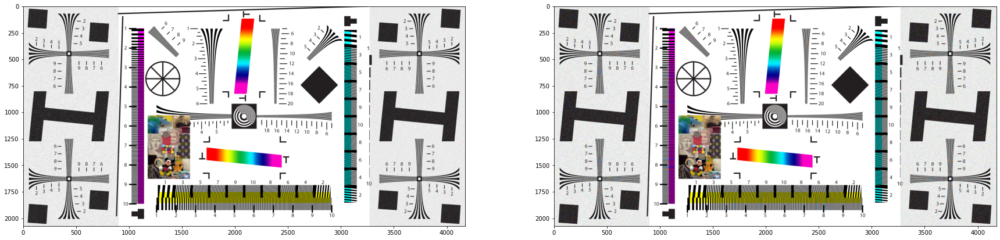

In [44]:
vnged = VNG(img)

plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.imshow(original_img)
plt.subplot(1, 2, 2)
plt.imshow(vnged)
plt.show()

## Сравниваем методы

In [15]:
def get_intensity(img, ):
    '''
    img: np.array with shape (H, W, 3)
    '''
    
    return (img @ np.array([0.299, 0.587, 0.114])).squeeze().round().astype(np.uint8)

PSNR для Bilinear: 23.708143133059757
PSNR для Improved Bilinear: 25.9238652901185
PSNR для VNG: 25.25880360955682


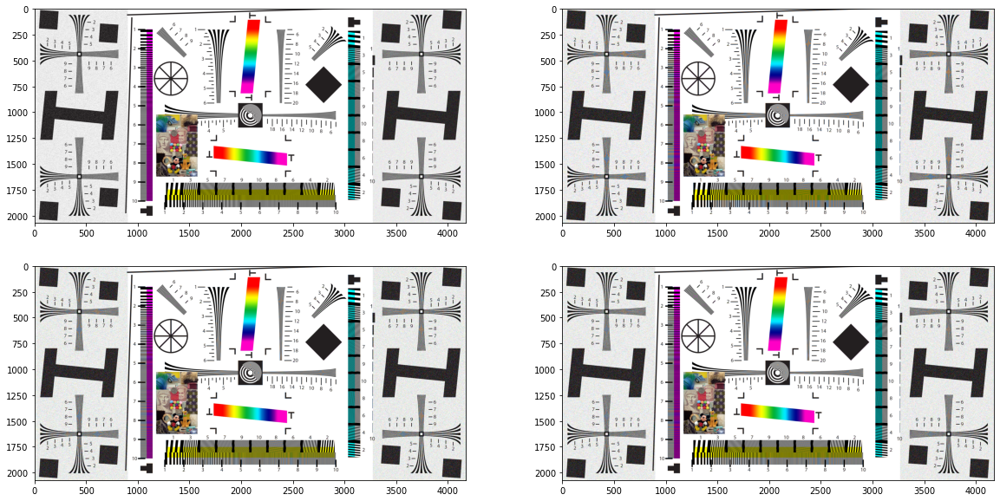

In [46]:
bilinear_interpolated = bilinear_interpolation(get_colored_img(img))
improved_interpolated = improved_interpolation(img)
VNG_interpolated = VNG(img)

bilinear_psnr = compute_psnr(get_intensity(bilinear_interpolated), get_intensity(original_img), eps=1e-18)
improved_psnr = compute_psnr(get_intensity(improved_interpolated), get_intensity(original_img), eps=1e-18)
VNG_psnr = compute_psnr(get_intensity(VNG_interpolated), get_intensity(original_img), eps=1e-18)

print(f"PSNR для Bilinear: {bilinear_psnr}")
print(f"PSNR для Improved Bilinear: {improved_psnr}")
print(f"PSNR для VNG: {VNG_psnr}")


plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.imshow(original_img)
plt.subplot(2, 2, 2)
plt.imshow(bilinear_interpolated)
plt.subplot(2, 2, 3)
plt.imshow(improved_interpolated)
plt.subplot(2, 2, 4)
plt.imshow(VNG_interpolated)
plt.show()

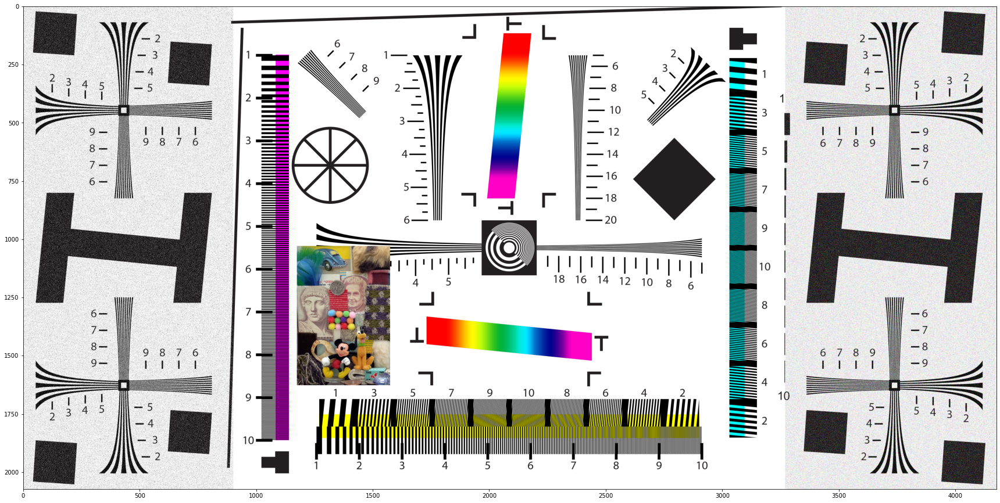

In [60]:
plt.figure(figsize=(30, 20))
plt.imshow(original_img)
plt.show()

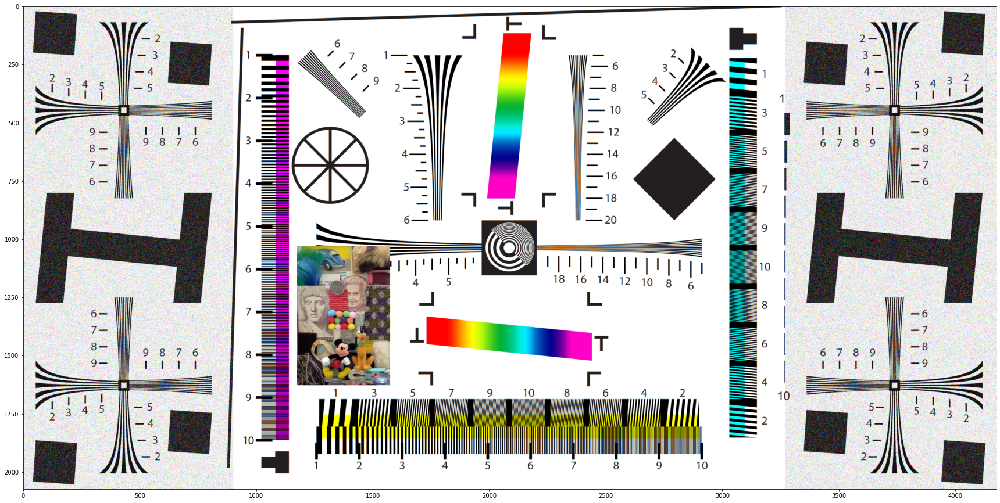

In [61]:
plt.figure(figsize=(30, 20))
plt.imshow(bilinear_interpolated)
cv2.imwrite("bilinear_interpolation.bmp", bilinear_interpolated)
plt.show()

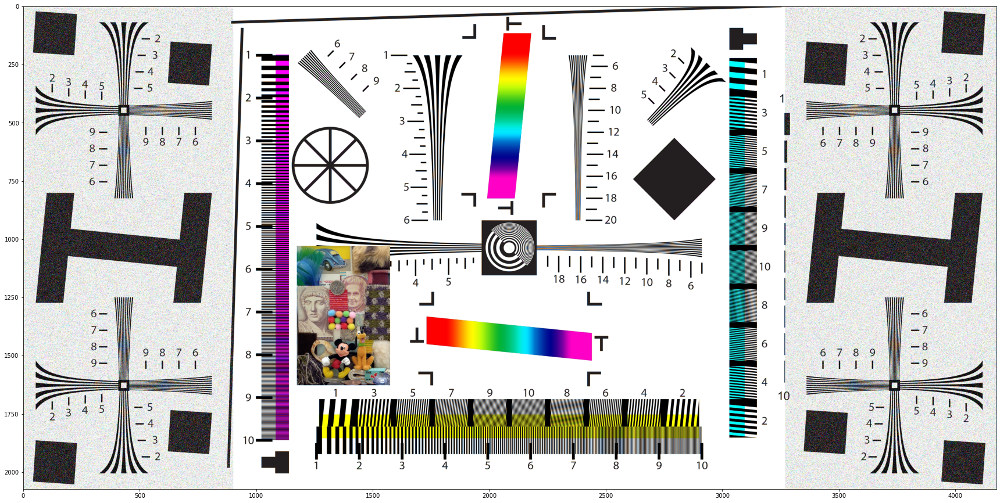

In [62]:
plt.figure(figsize=(30, 20))
plt.imshow(improved_interpolated)
cv2.imwrite("improved_interpolation.bmp", improved_interpolated)
plt.show()

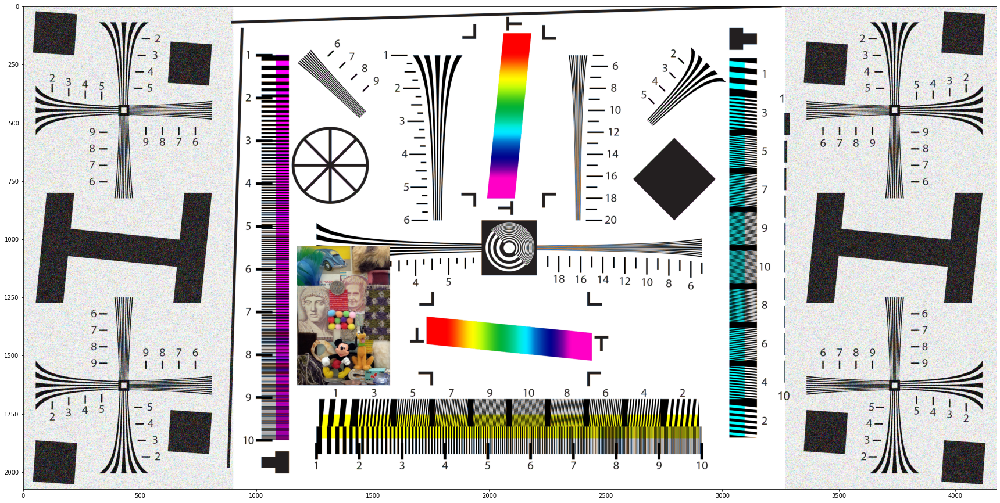

In [63]:
plt.figure(figsize=(30, 20))
plt.imshow(VNG_interpolated)
cv2.imwrite("VNG_interpolation.bmp", VNG_interpolated)
plt.show()

### Выводы

1. Получилось, что Improved Bilinear Interpolation показал себя лучше всего с точки зрения PSNR, что, возможно, связано с небольшими неточностями в реализации VNG
2. При сравнении разрешения получаем, что на VNG соответствующая часть рисунка, где можно разобрать частоту, ломатеся раньше, чем у Imporoved Interpolation